In [6]:
%matplotlib inline 
import sys
sys.path.append('/home/ptedesco/scripts_DP/scripts_from_Lois')
from Lois_L2tools import *
#
import matplotlib
import matplotlib.pyplot as py
import matplotlib.gridspec as gridspec
#import cmocean
import cartopy.crs as crs
import cartopy.feature as cfeature
#
import numpy as np 
import xmitgcm
import xgcm 
import oceanspy as ospyimport 
import xarray as xr
#from tqdm import tqdm
import time
from mpl_toolkits import basemap
from scipy import fftpack

from netCDF4 import Dataset

In [7]:
#define functions

def plot_proj(ax, lon, lat, lonmin, lonmax, latmin, latmax, dlon, dlat, draw_lon, draw_lat):
    #
    ax.coastlines(resolution='10m')
    land_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m',edgecolor='black', facecolor='lightgrey', linewidth=0.5)
    ax.add_feature(land_10m)
    #
    ax.set_extent([lonmin,lonmax,latmin,latmax], crs = crs.PlateCarree())
    #
    lon_grid = np.arange(lonmin,lonmax+dlon,dlon)
    lat_grid = np.arange(latmin,latmax+dlat,dlat)
    gl = ax.gridlines(draw_labels=True, xlocs=lon_grid, ylocs=lat_grid, linewidth=0.25,color='k',linestyle='-',x_inline=False, y_inline=False)
    if draw_lat == True: 
        gl.right_labels=False
        gl.ylabel_style = {'size': 22.5}
    else:
        gl.right_labels=False
        gl.left_labels=False
        
    if draw_lon == True: 
        gl.top_labels=False
        gl.xlabel_style = {'size': 22.5}
    else:
        gl.top_labels=False
        gl.bottom_labels=False 
        
        
def update_time_oceanspy(day, lonmin, lonmax, latmin, latmax, zz):
    
    #load model outputs at a snapshot -- full grid
    day2sec, dt_model = 3600*24, 60
    ds = xmitgcm.open_mdsdataset( model_dir, '/data/SO2/SO24/GRID/BIN',read_grid=True,
                             geometry = 'sphericalpolar',prefix = ['diags_3D'],
                             delta_t = dt_model, iters=[day*day2sec//dt_model] )#iters = [int(day_start*day2sec//dt_model),] )# iters = list(range(day_start*day2sec//dt_model, day_end*day2sec//dt_model, 3600//dt_model)))
    od, ds_ospy, grid = ds_to_ospy(ds, speed=False, bvf=True)


    #select domain in the grid
    od_cut = od.subsample.cutout(XRange=[lonmin, lonmax], YRange=[latmin, latmax], ZRange=zz)
    od_cut = od_cut.set_name("cutout", overwrite=False)
    
    return od_cut, od_cut._grid


In [8]:
# usefull pathways
model_dir = '/data/SO3/SO24/Run_60s_2006/'
savefig_dir = '/data/SO3/SO24/Pauline_T/fig/'
savedir = '/data/SO3/SO24/Pauline_T/'

In [5]:
'''
# load model outputs
day_start, day_end = 501, 578+30 #substract 237 days to get the actual simulation length
day2sec = 3600*24
dt_model, dt_saving = 60, 3600*6

ds = xmitgcm.open_mdsdataset( model_dir, '/data/SO2/SO24/GRID/BIN',read_grid=True,
                             geometry = 'sphericalpolar',prefix = ['diags_3D'],
                             delta_t = dt_model, iters=[day_start*day2sec//dt_model])#iters=list(range(day_start*day2sec//dt_model, day_end*day2sec//dt_model, dt_saving//dt_model)) )

#to oceanspy dataset
od, ds_ospy, grid = ds_to_ospy(ds, speed=False, bvf=True)

#sub-domain
#od_cut, grid_cut = update_time_oceanspy(501, -180+360, 180+360, -80, -30, -20)
'''

Computing potential density anomaly using the following parameters: {'eq_state': 'jmd95'}.
Computing Brunt-Väisälä Frequency using the following parameters: {'rho0': 1027, 'g': 9.81}.
Computing gradient.


In [ ]:
######################################################################################################################
######################################################################################################################
######################################################################################################################

In [ ]:

### plot annual means of temperature and salinity at the ocean surface (files from the WOA climatology)


In [9]:
## load climato grid
nc = Dataset('/home/ptedesco/woa23_decav_t00_04.nc','r')
#print(nc.variables)
lat_climato = nc.variables['lat'][:]
lon_climato = nc.variables['lon'][:]
depth = nc.variables['depth'][:]
temp = nc.variables['t_an'][:]
nc.close()

print(lon_climato.shape, np.nanmin(lon_climato), np.nanmax(lon_climato))
print(lat_climato.shape, np.nanmin(lat_climato), np.nanmax(lat_climato))
print(depth[0,...])
print(temp.shape)

## get sub domain (focus on the Southern Hemisphere (SO). If load the global map, the plotting funciton will crash!)
latmin, latmax = -90, -35
ind_latmin = np.argmin(abs(lat_climato - latmin))
ind_latmax = np.argmin(abs(lat_climato - latmax))
print(lat_climato[ind_latmin],lat_climato[ind_latmax])

## load temperature for the SO
nc = Dataset('/home/ptedesco/woa23_decav_t00_04.nc','r')
temp = nc.variables['t_an'][0,:,ind_latmin:ind_latmax+1,:]
lat_climato = nc.variables['lat'][ind_latmin:ind_latmax+1]
nc.close()

## load salinity for the SO
nc = Dataset('/home/ptedesco/woa23_decav_s00_04.nc','r')
salt = nc.variables['s_an'][0,:,ind_latmin:ind_latmax+1,:]
nc.close()

print(salt.shape, np.nanmin(salt), np.nanmax(salt))
print(temp.shape, np.nanmin(temp), np.nanmax(temp))



(1440,) -179.875 179.875
(720,) -89.875 89.875
0.0
(1, 102, 720, 1440)
-89.875 -35.125
(102, 220, 1440) 12.40171 36.30521
(102, 220, 1440) -2.09891 21.9858


In [12]:
## get the 34 psu salinity contour (it will be used to define the SAF -- refer to LEC 5 Part II)

# get the salinity contours
fig = py.figure(figsize=(20,10))
ax = fig.add_subplot(1,1,1, projection=crs.Orthographic(-60,-90))
cs_salt = ax.contour(lon_climato,lat_climato,salt[0,...],[34],linewidths=2,colors='k',transform=crs.PlateCarree())
py.cla()
py.clf()
py.close()

# isolate the salinitny contour corresponding to the SAF
size_vertices = []
for collection in cs_salt.collections:
    for path in collection.get_paths():
        # Vertices are the coordinates of the path
        vertices = path.vertices
        size_vertices.append(vertices.shape[0])

ind_max = np.where(size_vertices == np.max(size_vertices))
print(ind_max, size_vertices[ind_max[0][0]])

path  = collection.get_paths()[ind_max[0][0]]
vertices = path.vertices
x_sal34 = vertices[:, 0]
y_sal34 = vertices[:, 1]
print(x_sal34.shape)


(array([39]),) 1738
(1738,)


/home/ptedesco/.conda/envs/myenv/lib/python3.10/site-packages/matplotlib/colors.py:620: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


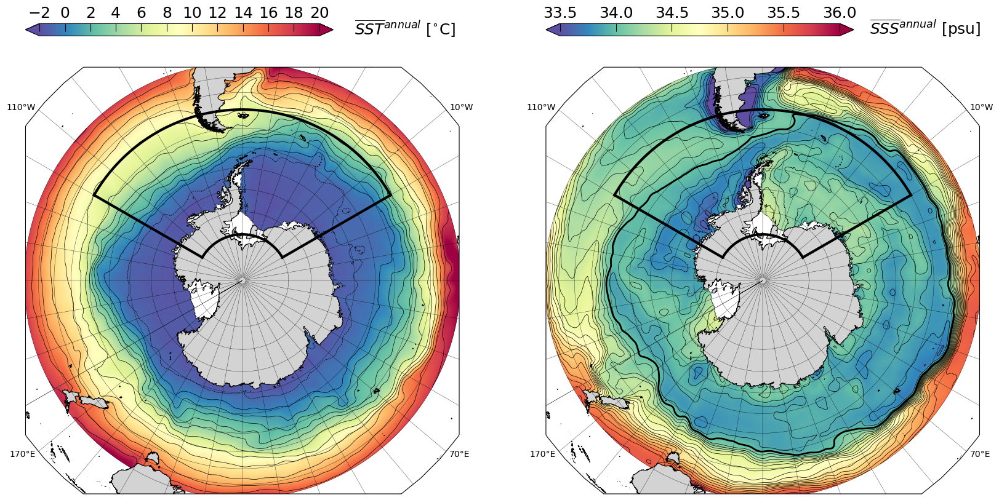

In [13]:
##########
## plot ##    
##########

ft = 18
fig = py.figure(figsize=(20,10))

###############
## subplot 1 ##    
###############
vmin, vmax, dtick = -2, 20, 2

ax = fig.add_subplot(1,2,1, projection=crs.Orthographic(-60,-90))
pos = ax.get_position()
plot_proj(ax, lon_climato, lat_climato , -180., 180., -80., -35., dlon=10, dlat=5, draw_lon=False, draw_lat=False)   
#plot
cs = ax.pcolormesh(lon_climato,lat_climato,temp[0,...],vmin=vmin,vmax=vmax,cmap=py.cm.Spectral_r,shading='gouraud',transform=crs.PlateCarree())
ax.contour(lon_climato,lat_climato,temp[0,...],np.arange(-2,4,1),linewidths=0.5,colors='k',transform=crs.PlateCarree())
ax.contour(lon_climato,lat_climato,temp[0,...],np.arange(4,20,2),linewidths=0.5,colors='k',transform=crs.PlateCarree())

#plot sub-domain
lonmin, lonmax, latmin, latmax = -120,0,-80,-50
ax.plot(np.ones(100)*lonmin, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.ones(100)*lonmax, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmin, color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmax, color='k', linewidth=3,transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0, pos.y0 + 0.75, 0.25, 0.02])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='both',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.875,pos.y0+0.935,r'$\overline{SST}^{annual} \ $[$^{\circ}$C]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)

###############
## subplot 2 ##    
###############
vmin, vmax, dtick = 33.5, 36, 0.5

ax = fig.add_subplot(1,2,2, projection=crs.Orthographic(-60,-90))
pos = ax.get_position()
plot_proj(ax, lon_climato, lat_climato , -180., 180., -80., -35., dlon=10, dlat=5, draw_lon=False, draw_lat=False)   
#plot
cs = ax.pcolormesh(lon_climato,lat_climato,salt[0,...],vmin=vmin,vmax=vmax,cmap=py.cm.Spectral_r,shading='gouraud',transform=crs.PlateCarree())
ax.contour(lon_climato,lat_climato,salt[0,...],np.arange(33.5,36.5,0.1),linewidths=0.5,colors='k',transform=crs.PlateCarree())
## plot the SAF (isohaline)
ax.plot(x_sal34, y_sal34, linewidth=2, color='k',transform=crs.PlateCarree())

#plot sub-domain
lonmin, lonmax, latmin, latmax = -120,0,-80,-50
ax.plot(np.ones(100)*lonmin, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.ones(100)*lonmax, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmin, color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmax, color='k', linewidth=3,transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0, pos.y0 + 0.75, 0.25, 0.02])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='both',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.875,pos.y0+0.935,r'$\overline{SSS}^{annual} \ $[psu]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)
       
#displaying
py.show()
py.cla()
py.clf()
py.close()


In [ ]:

## describe the temperature and salinity variations across the latitudinal (meridional) direction of the Southern Ocean
## What processes shape the tempereature and salinity distributions?


## the 34 salinity contour defines the SAF 
## Knowing that the PF is defined from the northern most extension of polar coald waters, what temperature value corresponds to the PF?

## HELP:
## you might need to plot the SAF (34 salinity value) on top of the temperature plot
## you might need to plot specific isotherms with bigger linewidths for the temperature plot
## you might need to find out how to plot the contour values on the temperature plot


In [ ]:

### plot the ocean surface flows (files from the OSCAR NASA dataset)


In [14]:
### load altimetry data ###

nc = Dataset('/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220101.nc','r')
#print(nc.variables)
lat_alti = nc.variables['lat'][:]
lon_alti = nc.variables['lon'][:]
u_alti = nc.variables['u'][0,:]
v_alti = nc.variables['v'][0,:]
nc.close()

print(u_alti.shape, lon_alti.shape, lat_alti.shape)

## get sub domain (focus on the Southern Hemisphere (SO). If load the global map, the plotting funciton will crash!)
latmin, latmax = -90, -35
ind_latmin = np.argmin(abs(lat_alti - latmin))
ind_latmax = np.argmin(abs(lat_alti - latmax))
print(lat_alti[ind_latmin],lat_alti[ind_latmax])

## get speed for the SO
lat_alti = lat_alti[ind_latmin:ind_latmax+1]
u_alti, v_alti = u_alti[:,ind_latmin:ind_latmax+1].data, v_alti[:,ind_latmin:ind_latmax+1].data
print(u_alti.shape, np.nanmin(u_alti), np.nanmax(u_alti))

speed_alti = np.sqrt(u_alti**2 + v_alti**2)
speed_alti[speed_alti==0.]=np.nan
speed_alti[speed_alti>10]=np.nan
print(np.nanmin(speed_alti), np.nanmax(speed_alti), np.nanmean(speed_alti))

      

(1440, 719) (1440,) (719,)
-89.75 -35.0
(1440, 220) -999.0 1.2833872459748106
0.0001282396234010888 1.602725411386982 0.13068257912856915


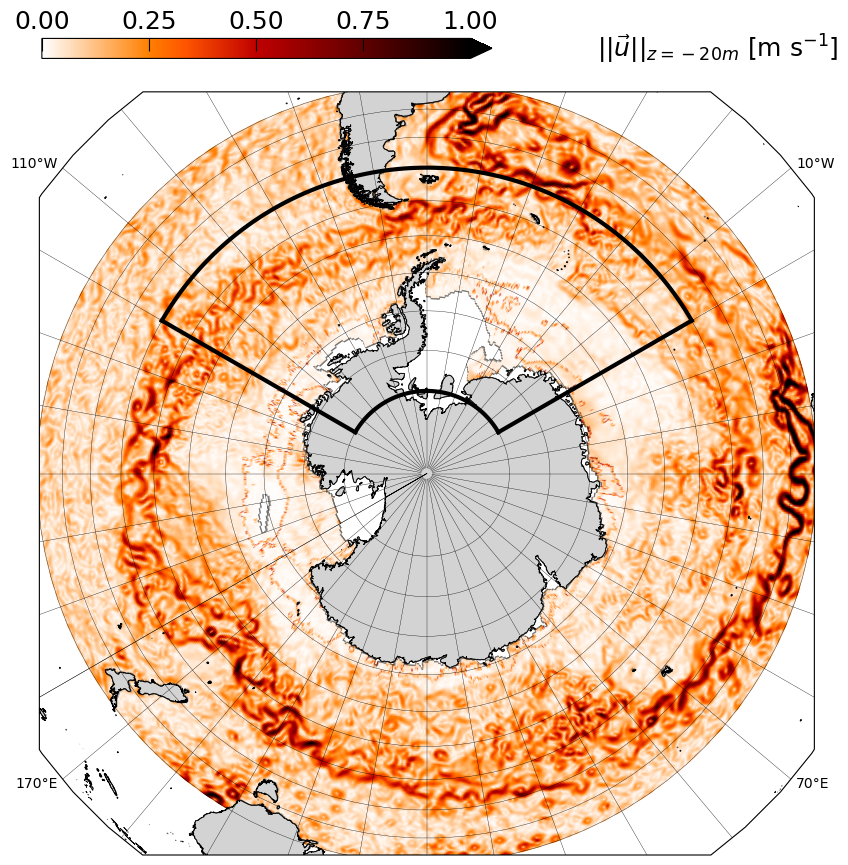

In [15]:
##########
## plot ##    
##########

ft = 18
fig = py.figure(figsize=(10,10))

#############
## subplot ##    
#############
vmin, vmax, dtick = 0, 1, 0.25

ax = fig.add_subplot(1,1,1, projection=crs.Orthographic(-60,-90))
pos = ax.get_position()
plot_proj(ax, lon_alti, lat_alti , -180., 180., -80., -35., dlon=10, dlat=5, draw_lon=False, draw_lat=False)   
#plot
cs = ax.pcolormesh(lon_alti,lat_alti,speed_alti.T,vmin=vmin,vmax=vmax,cmap=py.cm.gist_heat_r,shading='gouraud',transform=crs.PlateCarree())
#ax.contour(lon,lat,topo,[200,1000,3000],linewidths=0.5,colors='k',transform=crs.PlateCarree())

#plot sub-domain
lonmin, lonmax, latmin, latmax = -120,0,-80,-50
ax.plot(np.ones(100)*lonmin, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.ones(100)*lonmax, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmin, color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmax, color='k', linewidth=3,transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0, pos.y0 + 0.8, 0.45, 0.02])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='max',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.875,pos.y0+0.935,r'$\left|\left| \vec{u} \right|\right|_{z=-20m} \ $[m s$^{-1}$]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)
    
#displaying
py.show()
py.cla()
py.clf()
py.close()


In [ ]:

## What are the characteristics of the ACC? Is it a laminar smooth flow or it is a chaotic/turbulent flow meandering?
## Can you spot regiosn across the Southern Ocean, where the ACC is the most intense?



In [180]:

## compute and plot kinetic energy (don't worry about the mass, the final uit should be m2 s-2)
## HELP: you might need to adjust the colorbar when plotting

ke_alti = ???

ke_alti[ke_alti==0]=np.nan
ke_alti[ke_alti>10]=np.nan
print(ke_alti.shape, np.nanmin(ke_alti), np.nanmax(ke_alti), np.nanmean(ke_alti))



(1440, 220) 8.222700505026542e-09 1.2843643721527853 0.017731819871404732


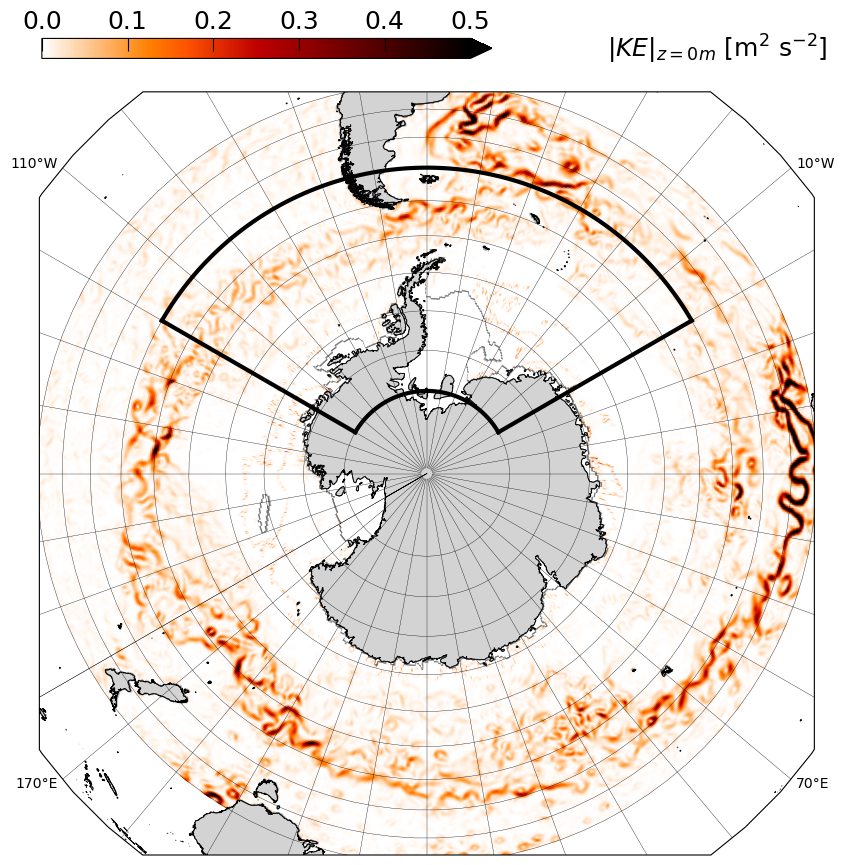

In [181]:
##########
## plot ##    
##########

fig = py.figure(figsize=(10,10))
vmin, vmax, dtick = 0, 1, 0.25 ## adjust the colorbar
ft = 18

#############
## subplot ##    
#############

ax = fig.add_subplot(1,1,1, projection=crs.Orthographic(-60,-90))
pos = ax.get_position()
plot_proj(ax, lon_alti, lat_alti , -180., 180., -80., -35., dlon=10, dlat=5, draw_lon=False, draw_lat=False)   
#plot
cs = ax.pcolormesh(lon_alti,lat_alti,ke_alti.T,vmin=vmin,vmax=vmax,cmap=py.cm.gist_heat_r,shading='gouraud',transform=crs.PlateCarree())
#ax.contour(lon,lat,topo,[200,1000,3000],linewidths=0.5,colors='k',transform=crs.PlateCarree())

#plot sub-domain
lonmin, lonmax, latmin, latmax = -120,0,-80,-50
ax.plot(np.ones(100)*lonmin, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.ones(100)*lonmax, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmin, color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmax, color='k', linewidth=3,transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0, pos.y0 + 0.8, 0.45, 0.02])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='max',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.875,pos.y0+0.935,r'$\left| KE \right|_{z=0m} \ $[m$^{2}$ s$^{-2}$]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)
    
#displaying
py.show()
py.cla()
py.clf()
py.close()


In [ ]:

## What difference in the ACC do you notice between the speed and the kinetic energy?
## Is it easier to spot regions, where the ACC is the most intense? Any idea why?
## Where is the ACC the most intense across the Southern Ocean?


In [ ]:

### plot topography on top of the ACC's speed OR kinetic energy


In [16]:
## load topography

Lon_sohi, Lat_sohi, topo = np.load('/home/ptedesco/oscar_nasa/topo_sohi_SO_region.npy')


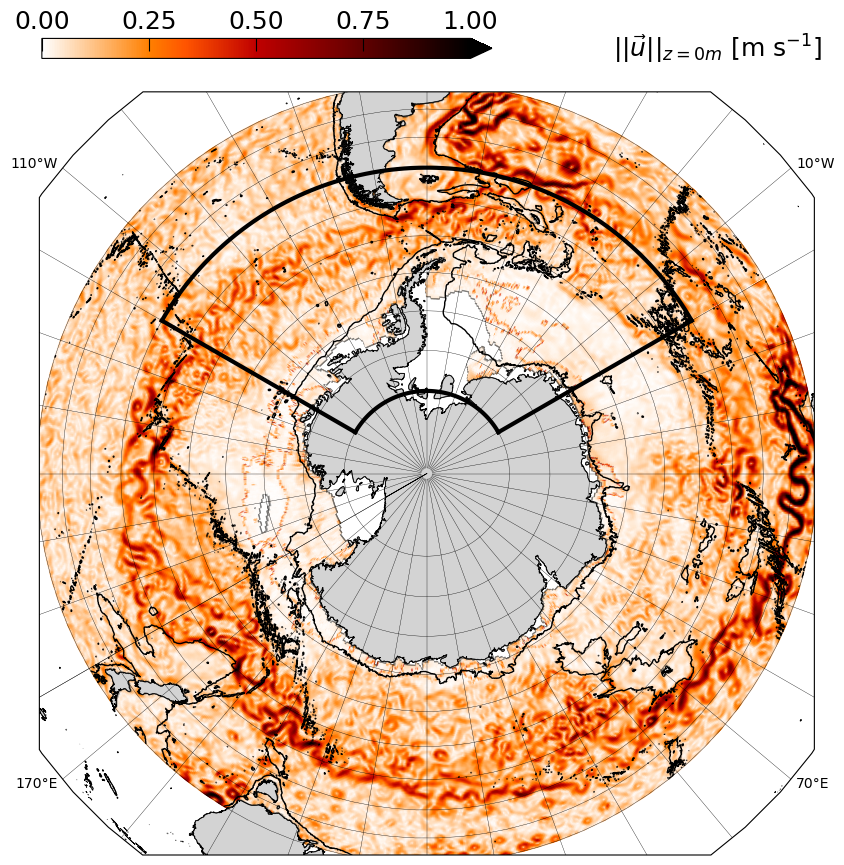

In [18]:
##########
## plot ##    
##########

fig = py.figure(figsize=(10,10))

vmin, vmax, dtick = 0, 1, 0.25
#vmin, vmax, dtick = 0, 0.5, 0.1
ft = 18

#############
## subplot ##    
#############

ax = fig.add_subplot(1,1,1, projection=crs.Orthographic(-60,-90))
pos = ax.get_position()
plot_proj(ax, lon_alti, lat_alti , -180., 180., -80., -35., dlon=10, dlat=5, draw_lon=False, draw_lat=False)   
#plot
cs = ax.pcolormesh(lon_alti,lat_alti,speed_alti.T,vmin=vmin,vmax=vmax,cmap=py.cm.gist_heat_r,shading='gouraud',transform=crs.PlateCarree())
ax.contour(Lon_sohi,Lat_sohi,topo,[2500],linewidths=1,colors='k',transform=crs.PlateCarree())

#plot sub-domain
lonmin, lonmax, latmin, latmax = -120,0,-80,-50
ax.plot(np.ones(100)*lonmin, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.ones(100)*lonmax, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmin, color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmax, color='k', linewidth=3,transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0, pos.y0 + 0.8, 0.45, 0.02])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='max',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.875,pos.y0+0.935,r'$\left|\left| \vec{u} \right|\right|_{z=0m} \ $[m s$^{-1}$]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)
    
#displaying
py.show()
py.cla()
py.clf()
py.close()



In [ ]:

## do the regions where the ACC is the most intense correspond to specific topographic features?
## How many of intense ACC/topographic feature regions do you count across the Southern Ocean?


In [ ]:

### plot topography & fronts & ACC's speed OR kinetic energy


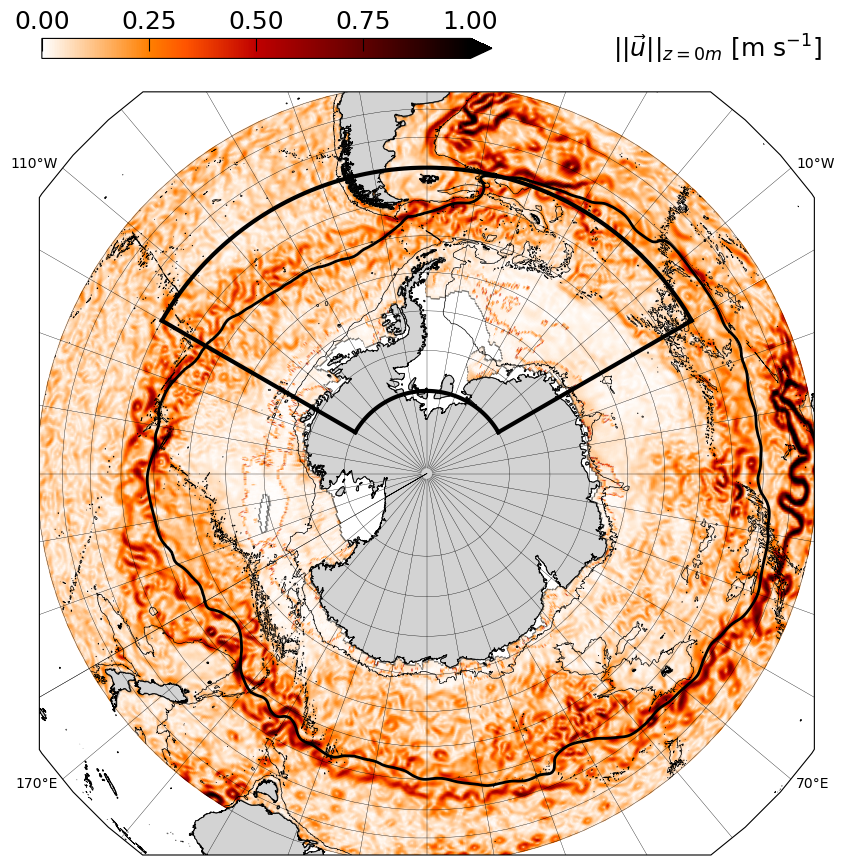

In [21]:
##########
## plot ##    
##########
fig = py.figure(figsize=(10,10))

vmin, vmax, dtick = 0, 1, 0.25
#vmin, vmax, dtick = 0, 0.25, 0.1
ft = 18

#############
## subplot ##    
#############

ax = fig.add_subplot(1,1,1, projection=crs.Orthographic(-60,-90))
pos = ax.get_position()
plot_proj(ax, lon_alti, lat_alti , -180., 180., -80., -35., dlon=10, dlat=5, draw_lon=False, draw_lat=False)   
#plot
cs = ax.pcolormesh(lon_alti,lat_alti,speed_alti.T,vmin=vmin,vmax=vmax,cmap=py.cm.gist_heat_r,shading='gouraud',transform=crs.PlateCarree())
ax.contour(Lon_sohi,Lat_sohi,topo,[2500],linewidths=0.5,colors='k',transform=crs.PlateCarree())
#plot the PF (isotherm you picked!)
#ax.contour(lon_climato, lat_climato, temp[0,...], [???], linewidths=2,colors='k',transform=crs.PlateCarree())
#plot the SAF (isohaline)
ax.plot(x_sal34, y_sal34, linewidth=2,color='k',transform=crs.PlateCarree())

#plot sub-domain
lonmin, lonmax, latmin, latmax = -120,0,-80,-50
ax.plot(np.ones(100)*lonmin, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.ones(100)*lonmax, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmin, color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmax, color='k', linewidth=3,transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0, pos.y0 + 0.8, 0.45, 0.02])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='max',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.875,pos.y0+0.935,r'$\left|\left| \vec{u} \right|\right|_{z=0m} \ $[m s$^{-1}$]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)
    
#displaying
py.show()
py.cla()
py.clf()
py.close()


In [ ]:

## is the choice of isotherm (PF) and isohaline (SAF) appropriate to define the two fronts constituting the ACC?
## if yes or no, why is that?
## do the fronts show a specifci patterns in regions of intense ACC/topographic features?


In [ ]:

### mean component and eddy component of the ACC's circulation


In [22]:
## mean component -- defined as a time-average

loadname_prefix = '/home/ptedesco/oscar_nasa/oscar_currents_nrt_2022'

# number of days for the months of Jan, Feb, March, April
day_list = [np.arange(1,32,1),
            np.arange(1,29,1),
            np.arange(1,32,1),
            np.arange(1,31,1)]

u_cum, v_cum, nindex = 0,0,0

for mm in np.arange(1,5,1):
    days = day_list[mm-1]
    print(mm,len(days))
    for dd in days:
        
        #update file to load
        loadname = loadname_prefix + "{:02d}".format(mm) + "{:02d}".format(dd) + '.nc'
        print(loadname)

        #load variables and do cumulative sum
        nc = Dataset(loadname, 'r')
        u_cum += nc.variables['u'][0,:,ind_latmin:ind_latmax+1]
        v_cum += nc.variables['v'][0,:,ind_latmin:ind_latmax+1]

        #increment
        nindex += 1

        nc.close()

u_mean = u_cum/nindex
v_mean = v_cum/nindex

speed_mean = np.sqrt(u_mean**2 + v_mean**2)
speed_mean[speed_mean == 0.]=np.nan
print(np.nanmin(speed_mean), np.nanmax(speed_mean), np.nanmean(speed_mean))


1 31
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220101.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220102.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220103.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220104.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220105.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220106.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220107.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220108.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220109.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220110.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220111.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220112.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220113.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220114.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220115.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220116.nc
/home/ptedesco/oscar_nasa/oscar_currents_nrt_20220117.nc
/home/ptedesco/oscar_nasa/

/tmp/ipykernel_807888/1877253451.py:35: RuntimeWarning: invalid value encountered in sqrt
  speed_mean = np.sqrt(u_mean**2 + v_mean**2)


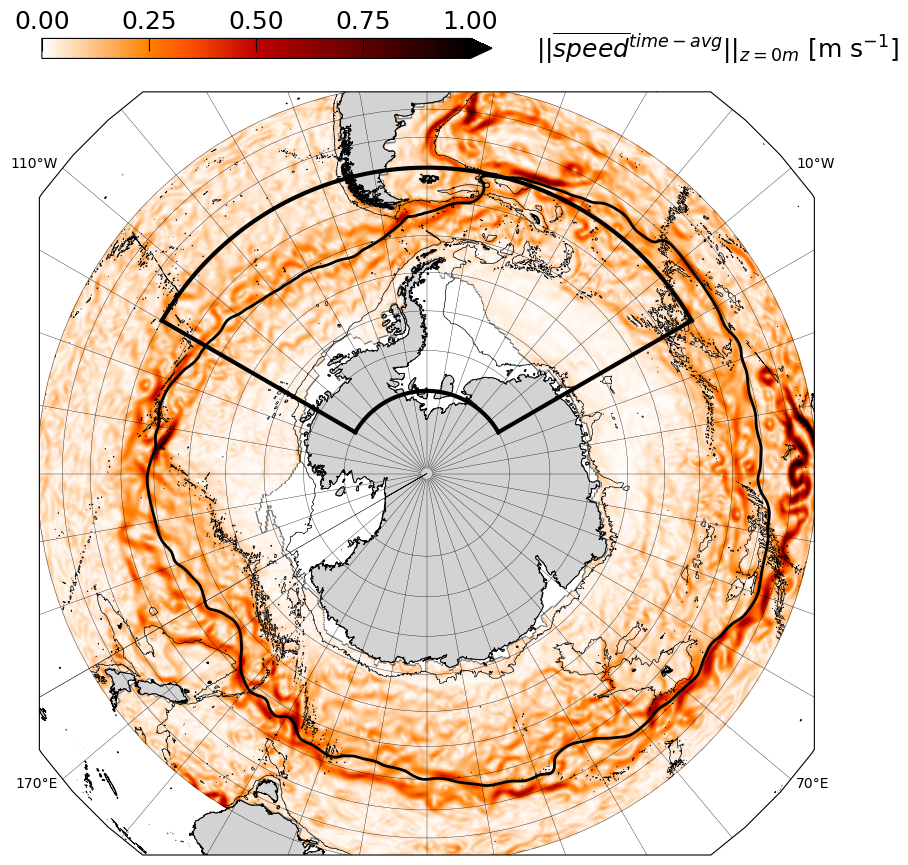

In [25]:
fig = py.figure(figsize=(10,10))

vmin, vmax, dtick = 0, 1, 0.25
#vmin, vmax, dtick = 0, 0.25, 0.05
ft = 18

#############
## subplot ##    
#############

ax = fig.add_subplot(1,1,1, projection=crs.Orthographic(-60,-90))
pos = ax.get_position()
plot_proj(ax, lon_alti, lat_alti , -180., 180., -80., -35., dlon=10, dlat=5, draw_lon=False, draw_lat=False)   
#plot
cs = ax.pcolormesh(lon_alti,lat_alti, speed_mean.T,vmin=vmin,vmax=vmax,cmap=py.cm.gist_heat_r,shading='gouraud',transform=crs.PlateCarree())
ax.contour(Lon_sohi,Lat_sohi,topo,[2500],linewidths=0.5,colors='k',transform=crs.PlateCarree())
#plot the PF (isotherm you picked!)
#ax.contour(lon_climato, lat_climato, temp[0,...], [???], linewidths=2,colors='k',transform=crs.PlateCarree())
#plot the SAF (isohaline)
ax.plot(x_sal34, y_sal34, linewidth=2,color='k',transform=crs.PlateCarree())

#plot sub-domain
lonmin, lonmax, latmin, latmax = -120,0,-80,-50
ax.plot(np.ones(100)*lonmin, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.ones(100)*lonmax, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmin, color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmax, color='k', linewidth=3,transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0, pos.y0 + 0.8, 0.45, 0.02])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='max',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.875,pos.y0+0.935,r'$\left|\left| \overline{speed}^{time-avg} \right|\right|_{z=0m} \ $[m s$^{-1}$]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)
    
#displaying
py.show()
py.cla()
py.clf()
py.close()



In [26]:

## eddy component -- get the eddy speed and kinetic energy

## both eddy variables use the u- and v-velocity standard deviation
## HELP:
## FIRST compute the eddy speed OR eddy kinetic energy for a snapshot
## THEN compute the time-averaged eddy speed OR eddy kinetic energy for a period of a few months


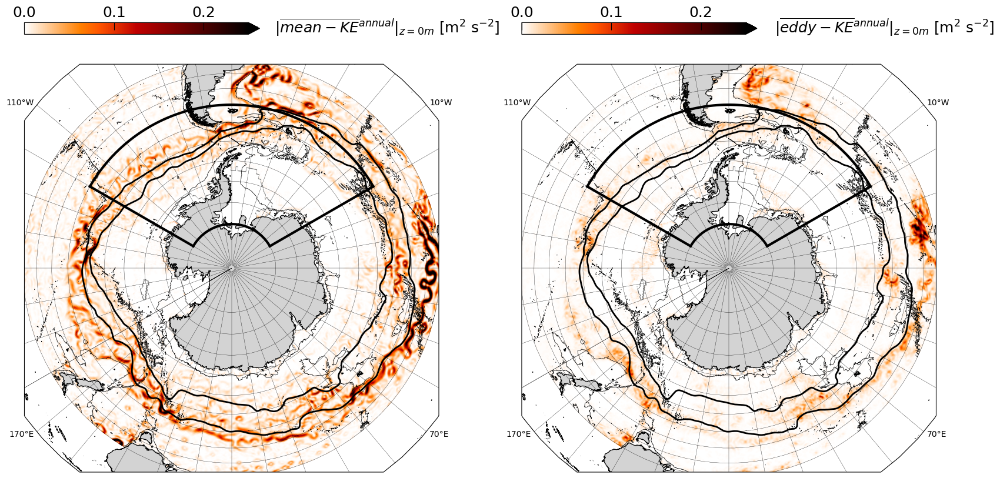

In [204]:
##########
## plot ##    
##########
ft = 18
fig = py.figure(figsize=(20,10))

#############
## subplot ##    
#############
vmin, vmax, dtick = 0, 1, 0.5

ax = fig.add_subplot(1,2,1, projection=crs.Orthographic(-60,-90))
pos = ax.get_position()
plot_proj(ax, lon_alti, lat_alti , -180., 180., -80., -35., dlon=10, dlat=5, draw_lon=False, draw_lat=False)   
#plot
cs = ax.pcolormesh(lon_alti,lat_alti, speed_mean.T,vmin=vmin,vmax=vmax,cmap=py.cm.gist_heat_r,shading='gouraud',transform=crs.PlateCarree())
ax.contour(lon_sohi,lat_sohi,topo,[2500],linewidths=0.5,colors='k',transform=crs.PlateCarree())
#plot the PF (isotherm you picked!)
#ax.contour(lon_climato, lat_climato, temp[0,...], [???], linewidths=2,colors='k',transform=crs.PlateCarree())
#plot the SAF (isohaline)
ax.plot(x_sal34, y_sal34, linewidth=2,color='k',transform=crs.PlateCarree())

#plot sub-domain
lonmin, lonmax, latmin, latmax = -120,0,-80,-50
ax.plot(np.ones(100)*lonmin, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.ones(100)*lonmax, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmin, color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmax, color='k', linewidth=3,transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0, pos.y0 + 0.75, 0.2, 0.02])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='max',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.875,pos.y0+0.935,r'$\left|\left| \overline{mean-speed}^{time-avg} \right|\right|_{z=0m} \ $[m s$^{-1}$]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)

#############
## subplot ##    
#############
vmin, vmax, dtick = 0, 1, 0.5

ax = fig.add_subplot(1,2,2, projection=crs.Orthographic(-60,-90))
pos = ax.get_position()
plot_proj(ax, lon_alti, lat_alti , -180., 180., -80., -35., dlon=10, dlat=5, draw_lon=False, draw_lat=False)   
#plot
cs = ax.pcolormesh(lon_alti,lat_alti, speed_eddy.T,vmin=vmin,vmax=vmax,cmap=py.cm.gist_heat_r,shading='gouraud',transform=crs.PlateCarree())
ax.contour(lon_sohi,lat_sohi,topo,[2500],linewidths=0.5,colors='k',transform=crs.PlateCarree())
#plot the PF (isotherm you picked!)
#ax.contour(lon_climato, lat_climato, temp[0,...], [???], linewidths=2,colors='k',transform=crs.PlateCarree())
#plot the SAF (isohaline)
ax.plot(x_coords, y_coords, linewidth=2,color='k',transform=crs.PlateCarree())

#plot sub-domain
lonmin, lonmax, latmin, latmax = -120,0,-80,-50
ax.plot(np.ones(100)*lonmin, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.ones(100)*lonmax, np.linspace(latmin,latmax,100), color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmin, color='k', linewidth=3,transform=crs.PlateCarree())
ax.plot(np.linspace(lonmin,lonmax,100), np.ones(100)*latmax, color='k', linewidth=3,transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0, pos.y0 + 0.75, 0.2, 0.02])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='max',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.875,pos.y0+0.935,r'$\left|\left| \overline{eddy-speed}^{time-avg} \right|\right|_{z=0m} \ $[m s$^{-1}$]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)
    

#displaying
py.show()
py.cla()
py.clf()
py.close()


In [ ]:

### compare the time-mean and time-eddy components of the ACC's circulation
### Do they show the same spatial variations?
### Is one of the two more intense than the other?
### what can you conclude on the ACC dynamics?



In [ ]:

### compare altimetric-velocities and model-velocities

### Altimetry data are from the OSCAR NASA dataset and have a horizontal resolution of 1/4 deg
### the model is called SOHI and has a horizontal resolution of 1/24 deg
### based on the different resolution of the satellite and model data, do you expect any differences fron the two ACC speeds?


In [27]:
## load the model (SOHI) velocity
(Lon_sohi, Lat_sohi, u,v,topo) = np.load('/home/ptedesco/oscar_nasa/lon_lat_u_v_topo_sohi_DP_region.npy')


## load the altimetry velocity interpolated on the model-grid 
(u_interp, v_interp) = np.load('/home/ptedesco/oscar_nasa/lon_lat_u_v_topo_alti_interp_DP_region.npy')



In [28]:
## get the ACC speed OR kinetic energy for the two datasets

## model
speed_sohi = np.sqrt(u**2 + v**2)
speed_sohi[speed_sohi==0.]=np.nan
speed_sohi[speed_sohi>10]=np.nan
del u, v

print(np.nanmin(speed_sohi),np.nanmax(speed_sohi), np.nanmean(speed_sohi))

## altimetry
speed_alti_interp = np.sqrt(u_interp**2 + v_interp**2)
speed_alti_interp[speed_alti_interp==0.]=np.nan
speed_alti_interp[speed_alti_interp>10]=np.nan
del u_interp, v_interp

print(np.nanmin(speed_alti_interp),np.nanmax(speed_alti_interp), np.nanmean(speed_alti_interp))


4.069304e-05 3.0347166 0.15939172
1.3987201599562758e-05 9.936870450438727 0.10148652039423034


/home/ptedesco/.conda/envs/myenv/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1785: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = super().pcolormesh(*args, **kwargs)
/home/ptedesco/.conda/envs/myenv/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1785: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = super().pcolormesh(*args, **kwargs)


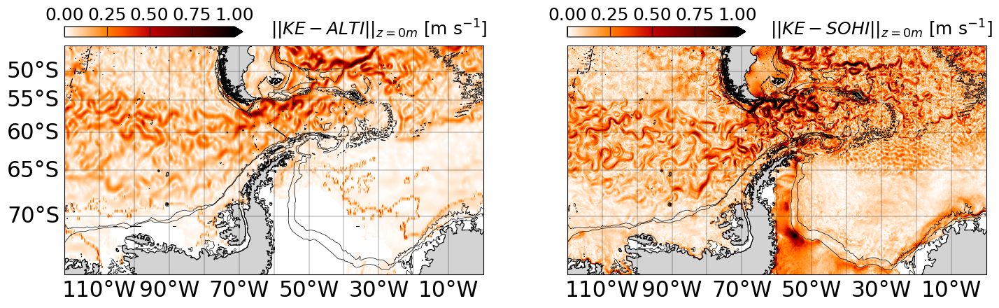

In [30]:
ft = 18

##########
## plot ##    
##########

fig = py.figure(figsize=(17,10))

#############
## subplot ##    
#############
vmin, vmax, dtick = 0, 1, 0.25

ax = fig.add_subplot(1,2,1, projection=crs.Mercator(central_longitude=-60))
pos = ax.get_position()
plot_proj(ax, Lon_sohi, Lat_sohi , -120., 0., -75., -45, dlon=10, dlat=5, draw_lon=True, draw_lat=True)   
#plot
cs = ax.pcolormesh(Lon_sohi, Lat_sohi, speed_alti_interp, vmin=vmin, vmax=vmax, cmap=py.cm.gist_heat_r, transform=crs.PlateCarree())
ax.contour(Lon_sohi, Lat_sohi, topo, [200,1000,2500], linewidths=0.5, colors='k', transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0,pos.y0 + 0.475,0.15, 0.015])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='max',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.75,pos.y0+0.85,r'$\left|\left| KE-ALTI \right|\right|_{z=0m} \ $[m s$^{-1}$]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)

#############
## subplot ##    
#############
vmin, vmax, dtick = 0, 1, 0.25

ax = fig.add_subplot(1,2,2, projection=crs.Mercator(central_longitude=-60))
pos = ax.get_position()
plot_proj(ax, Lon_sohi, Lat_sohi , -120., 0., -75., -45, dlon=10, dlat=5, draw_lon=True, draw_lat=False)   
#plot
cs = ax.pcolormesh(Lon_sohi, Lat_sohi, speed_sohi, vmin=vmin, vmax=vmax, cmap=py.cm.gist_heat_r, transform=crs.PlateCarree())
ax.contour(Lon_sohi, Lat_sohi, topo, [200,1000,2500], linewidths=0.5, colors='k', transform=crs.PlateCarree())

#colorbar
cbar_ax = fig.add_axes([pos.x0,pos.y0 + 0.475,0.15, 0.015])
cbar = py.colorbar(cs, cax = cbar_ax, orientation ='horizontal',extend='max',ticks=np.arange(vmin,vmax+dtick,dtick))
cbar.ax.tick_params(axis='x',direction='in',top=True, bottom=False,labeltop=True, labelbottom=False,length=9,labelsize=ft)
fig.text(0.75,pos.y0+0.85,r'$\left|\left| KE-SOHI \right|\right|_{z=0m} \ $[m s$^{-1}$]',ha='center',va='baseline',transform=ax.transAxes,fontsize=ft)
 
#displaying
py.show()
py.cla()
py.clf()
py.close()


In [ ]:

## knowing that altimetry data have a resolution 1/4deg and the SOhi model has a resolution of 1/24deg
## what are the altimetry and model resolutions in km? 
## HINT: consider latitude of 60S
## HINT: deg-to-km conversion formla is in LEC 7 Eddies & MOC Part II

## what spatial scales are resolved in the model but not in the altimetry data?
## Do the model-resolved spatial scales amount for much energy ?
## What are they called?
